In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
import pyarrow.parquet as pq

In [2]:
X_train = pd.read_parquet("train.parquet")
X_test = pd.read_parquet("test.parquet")

In [3]:
#Suite insight 1

In [4]:
#Payment_type

X_train['payment_type'].value_counts()

#15% payent en cash( valeur 2).On a tendance à penser que les gens payant en cash ont tendance à laisser plus souvent un pourboire

payment_type
1    83406
2    15377
4      850
3      367
Name: count, dtype: int64

C:\Users\rober\AppData\Local\Temp\ipykernel_30836\1305505706.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='payment_type', y='tip_amount', data=X_train, palette='Set2')


<Axes: xlabel='payment_type', ylabel='tip_amount'>

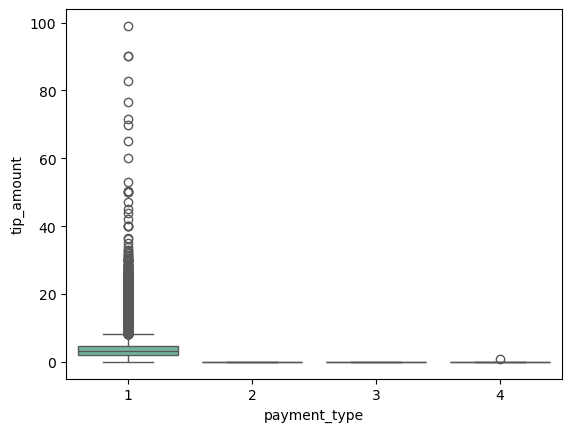

In [15]:
import seaborn as sns
sns.boxplot(x='payment_type', y='tip_amount', data=X_train, palette='Set2')

#Tendance non confirméee

In [16]:
#Congestion surcharge

X_train['congestion_surcharge'].value_counts()

congestion_surcharge
2.5    93405
0.0     6595
Name: count, dtype: int64

In [17]:
X_test['congestion_surcharge'].value_counts()
#La valeur 1 apparait 2 fois dans les données de test


congestion_surcharge
2.5    2451668
0.0     175493
1.0          2
Name: count, dtype: int64

In [18]:
X_test[X_test['congestion_surcharge']==1]

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,payment_type,fare_amount,extra,mta_tax,tolls_amount,improvement_surcharge,congestion_surcharge,Airport_fee,PU_location_lat,PU_location_lon,DO_location_lat,DO_location_lon
row_ID,,,,,,,,,,,,,,,,,,,
1863042,1,2024-01-23 20:00:56,2024-01-23 20:12:07,2.0,1.8,1.0,N,1,12.8,1.0,4.0,0.00,0.0,1.0,0.0,40.782477,-73.965555,40.765484,-73.954739
2387235,1,2024-01-26 20:48:20,2024-01-26 21:16:59,1.0,8.9,1.0,N,1,39.4,1.0,4.0,6.94,0.0,1.0,0.0,40.773633,-73.981532,40.670374,-73.981414


In [19]:
"""
#On va tester en supprimant parce que la congestion surcharge est inversement lieé à la longitude, la latitude 
et d'après nos informations
#https://www.nyc.gov/site/tlc/about/congestion-surcharge.page

Donc la congestion_surcharge est liée à la localisation du pickup et du dropoff

Il y a une certaine zone qui est concernée par 
#D'ou vient la valeur 1 ??
"""

"\n#On va tester en supprimant parce que la congestion surcharge est inversement lieé à la longitude, la latitude \net d'après nos informations\n#https://www.nyc.gov/site/tlc/about/congestion-surcharge.page\n\nDonc la congestion_surcharge est liée à la localisation du pickup et du dropoff\n\nIl y a une certaine zone qui est concernée par \n#D'ou vient la valeur 1 ??\n"

In [20]:
X_train['Airport_fee'].value_counts()

Airport_fee
0.00    91951
1.75     8049
Name: count, dtype: int64

In [27]:
X_test['Airport_fee'].value_counts()

Airport_fee
0.00    2413176
1.75     213987
Name: count, dtype: int64

In [29]:
"""
pip install folium matplotlib mapclassify
"""

'\npip install folium matplotlib mapclassify\n'

In [33]:
import geopandas as gpd
from shapely.geometry import Point
import pandas as pd

# les trajets concernées par les "Airport fees"
pu_location = X_train[X_train['Airport_fee'] != 0.0][['PU_location_lat', 'PU_location_lon']]
do_location = X_train[X_train['Airport_fee'] != 0.0][['DO_location_lat', 'DO_location_lon']]


geometry_pu = [Point(xy) for xy in zip(pu_location['PU_location_lon'], pu_location['PU_location_lat'])]
geometry_do = [Point(xy) for xy in zip(do_location['DO_location_lon'], do_location['DO_location_lat'])]


gdf_pu = gpd.GeoDataFrame(pu_location, geometry=geometry_pu, crs="EPSG:4326")
gdf_do = gpd.GeoDataFrame(do_location, geometry=geometry_do, crs="EPSG:4326")


gdf_pu.explore()


#Il y a trois aéroports 




In [34]:
gdf_do.explore()



In [35]:
pu_location.value_counts()

PU_location_lat  PU_location_lon
40.646985        -73.786530         4588
40.774376        -73.873628         3070
40.763352        -73.868395          375
40.740674        -73.840865            4
40.757312        -73.885317            2
40.662186        -73.764505            1
40.678953        -73.790987            1
40.694428        -73.790965            1
40.723995        -73.902331            1
40.726155        -73.863338            1
40.745379        -73.948892            1
40.749914        -73.970443            1
40.775932        -73.946510            1
40.780436        -73.957012            1
40.788193        -73.815657            1
Name: count, dtype: int64

In [36]:
do_location.value_counts()

DO_location_lat  DO_location_lon
40.759818        -73.984197         423
40.758028        -73.977698         230
40.748575        -73.985156         199
40.762253        -73.989845         197
40.756688        -73.972356         164
                                   ... 
40.661622        -73.968914           1
40.586555        -74.132985           1
40.586786        -74.085512           1
40.618768        -74.073703           1
40.528686        -74.187679           1
Name: count, Length: 235, dtype: int64

In [37]:
#Les trajets non concernés par la 'congestion_surcharge', payée par ceux dont les trajets débutent, passent ou finissent dans cette zone



pu_location = X_train[X_train['congestion_surcharge'] == 0.0][['PU_location_lat', 'PU_location_lon']]

geometry = [Point(xy) for xy in zip(pu_location['PU_location_lon'], pu_location['PU_location_lat'])]

gdf = gpd.GeoDataFrame(pu_location, geometry=geometry, crs="EPSG:4326")

gdf.explore()

In [38]:

do_location = X_train[X_train['congestion_surcharge'] == 0.0][['DO_location_lat', 'DO_location_lon']]

geometry = [Point(xy) for xy in zip(do_location['DO_location_lon'], do_location['DO_location_lat'])]
gdf = gpd.GeoDataFrame(do_location, geometry=geometry, crs="EPSG:4326")

gdf.explore()

In [39]:
"""
Plusieurs éléments ne concordent pas:
https://www.nyc.gov/site/tlc/about/congestion-surcharge.page
Plusieurs trajets démarrant ou terminant dans la congestion zone ont une congestion surcharge égale à 0.
On ne peut donc pas résumer l'information congestion surcharge à la localisation du point de départ ou d'arrivée
En plus la valeur 1 apparait 2 fois. Il était évoqué dans la source d'information que 
Quid de cette variable?

New York compte 3 aéroports
Concernant l'Airport fee, on remarque que parmi les trajets ayant une Airport_fee
La Guardia est la 2e localisation la plus relevée parmi les "pickup" (<5% du total)
Le JFK Airport est la 2e localisation la plus relevée parmi les "pickup" (>25% du total et <5% du total)
Le Newark est la 2e localisation la plus relevée parmi les "dropout" (<5%)

Cependant, cela dénote avec ce qu'on a obtenu comme information ici :https://www.nyc.gov/site/tlc/passengers/taxi-fare.page
Apparemment les "Airport_fee" concernent ceux qui démarrent ou terminent leur trajet à un aéroport, ce qui n'est pas le cas.
Quid de cette variable
#On remarque que des trajets concernant l'Airport fee n'ont pas d'aéroport comme point de départ ni d'arrivée
#On ne peut donc résumer l'information "Airport_fee" par les données de localisation du "Dropout" ni du "Pickup"
"""

'\nPlusieurs éléments ne concordent pas:\nhttps://www.nyc.gov/site/tlc/about/congestion-surcharge.page\nPlusieurs trajets démarrant ou terminant dans la congestion zone ont une congestion surcharge égale à 0.\nOn ne peut donc pas résumer l\'information congestion surcharge à la localisation du point de départ ou d\'arrivée\nEn plus la valeur 1 apparait 2 fois. Il était évoqué dans la source d\'information que \nQuid de cette variable?\n\nNew York compte 3 aéroports\nConcernant l\'Airport fee, on remarque que parmi les trajets ayant une Airport_fee\nLa Guardia est la 2e localisation la plus relevée parmi les "pickup" (<5% du total)\nLe JFK Airport est la 2e localisation la plus relevée parmi les "pickup" (>25% du total et <5% du total)\nLe Newark est la 2e localisation la plus relevée parmi les "dropout" (<5%)\n\nCependant, cela dénote avec ce qu\'on a obtenu comme information ici :https://www.nyc.gov/site/tlc/passengers/taxi-fare.page\nApparemment les "Airport_fee" concernent ceux qui 

"\nC'est dommage car on semble voir une claire différence entre ceux payant les frais d'aéroport et ne les payant pas\nDifficile de montrer une différence statistique car 92% ne payent pas d'Airport fee"

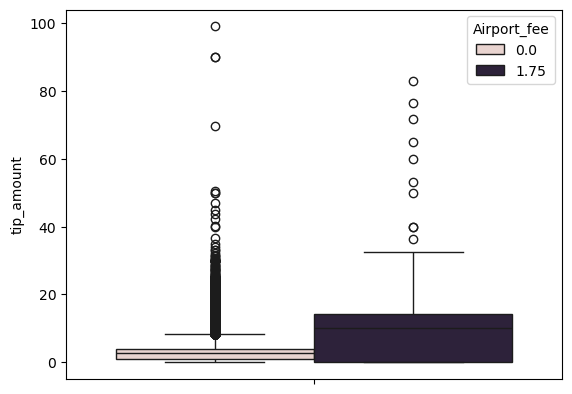

In [45]:
sns.boxplot(y='tip_amount', data=X_train, hue='Airport_fee')
"""
C'est dommage car on semble voir une claire différence entre ceux payant les frais d'aéroport et ne les payant pas
Difficile de montrer une différence statistique car 92% ne payent pas d'Airport fee"""

In [47]:
#Abordons la mta_tax
X_train['mta_tax'].value_counts()

mta_tax
0.5    99463
0.0      537
Name: count, dtype: int64

In [49]:
X_test['mta_tax'].value_counts()
"""
Meme propotions de valeurs égales à 0.5 (>95% environ). Est-ce que des valeurs inconnues comme 
la valeur 4 empêche peut-être de généraliser le modèle
"""

'\nMeme propotions de valeurs égales à 0.5 (>95% environ). Est-ce que des valeurs inconnues comme \nla valeur 4 empêche peut-être de généraliser le modèle\n'

<Axes: ylabel='tip_amount'>

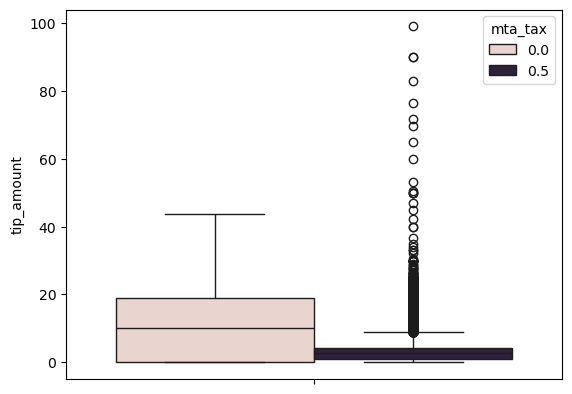

In [51]:
sns.boxplot(y='tip_amount', data=X_train, hue='mta_tax')

#Difficile d'établir une différence significative. 99.5% payent la mta_tax mais pas forcément un lien de cause à effet 
#En plus il y a une valeur inconnue 4 qui va peut-être empeecher de généraliser le modèle
#A supprimer ??

In [107]:
X_test[X_test['payment_type']==2]

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,payment_type,fare_amount,extra,mta_tax,tolls_amount,improvement_surcharge,congestion_surcharge,Airport_fee,PU_location_lat,PU_location_lon,DO_location_lat,DO_location_lon
row_ID,,,,,,,,,,,,,,,,,,,
2,2,2024-01-24 15:47:27,2024-01-24 15:51:48,2.0,0.43,1.0,N,2,5.8,0.0,0.5,0.0,1.0,0.0,0.0,40.791705,-73.973049,40.797962,-73.968168
4,2,2024-01-16 05:54:03,2024-01-16 05:55:59,1.0,0.71,1.0,N,2,5.1,1.0,0.5,0.0,1.0,2.5,0.0,40.748427,-73.999918,40.748427,-73.999918
7,2,2024-01-26 14:42:39,2024-01-26 14:51:33,1.0,0.99,1.0,N,2,9.3,0.0,0.5,0.0,1.0,0.0,0.0,40.790011,-73.945750,40.804334,-73.951292
23,2,2024-01-04 20:23:27,2024-01-04 20:51:35,1.0,4.44,1.0,N,2,28.2,1.0,0.5,0.0,1.0,2.5,0.0,40.753513,-73.988787,40.804334,-73.951292
29,2,2024-01-11 21:26:43,2024-01-11 21:53:15,4.0,7.80,1.0,N,2,36.6,1.0,0.5,0.0,1.0,2.5,0.0,40.702259,-73.985702,40.759818,-73.984197
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2627118,2,2024-01-31 11:41:26,2024-01-31 11:53:44,1.0,0.51,1.0,N,2,11.4,0.0,0.5,0.0,1.0,2.5,0.0,40.756688,-73.972356,40.756688,-73.972356
2627138,1,2024-01-15 08:20:49,2024-01-15 08:32:46,1.0,2.50,1.0,N,2,14.9,2.5,0.5,0.0,1.0,2.5,0.0,40.727620,-73.985937,40.748497,-73.992438
2627144,2,2024-01-04 08:32:43,2024-01-04 08:46:18,1.0,1.67,1.0,N,2,14.2,0.0,0.5,0.0,1.0,2.5,0.0,40.782477,-73.965555,40.780436,-73.957012


In [111]:
X_test['payment_type'].value_counts()

payment_type
1    2193448
2     402040
4      21690
3       9985
Name: count, dtype: int64

In [115]:
X_train.iloc[[31608,32320,26513,63303]]

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,congestion_surcharge,Airport_fee,PU_location_lat,PU_location_lon,DO_location_lat,DO_location_lon
31608,2,2024-01-29 03:21:23,2024-01-29 03:27:12,1.0,1.84,1.0,N,1,9.3,1.0,0.5,99.0,0.0,1.0,2.5,0.00,40.735035,-74.008984,40.748575,-73.985156
32320,2,2024-01-14 19:49:46,2024-01-14 20:06:47,1.0,3.06,1.0,N,1,19.1,0.0,0.5,90.0,0.0,1.0,2.5,0.00,40.726290,-74.007486,40.766238,-73.995135
26513,2,2024-01-27 03:28:57,2024-01-27 03:39:24,1.0,2.24,1.0,N,1,12.8,1.0,0.5,90.0,0.0,1.0,2.5,0.00,40.735035,-74.008984,40.748575,-73.985156
63303,2,2024-01-17 19:33:24,2024-01-17 19:36:53,1.0,2.00,1.0,N,1,10.0,7.5,0.5,53.0,0.0,1.0,0.0,1.75,40.774376,-73.873628,40.761493,-73.919694
